# Objectives Figure

This notebook provides a simple demonstration of some objectives for use in the flexible subset selection strategy for data visualization. This notebook generates Figure 2 of the paper in  figures/objectives.pdf. The random dataset generated for the example and the subsets selected can be found in data/2-objectives.

### Imports and Setup

In [1]:
# Standard library
import logging
from pathlib import Path

# Third party
import matplotlib.pyplot as plt
import matplotlib_inline

import numpy as np
import pandas as pd
import seaborn as sns 

# Local files
import flexibleSubsetSelection as fss

# Initialize notebook settings
sns.set_theme() # set seaborn theme
matplotlib_inline.backend_inline.set_matplotlib_formats('svg') # vector plots
%load_ext autoreload
%autoreload 2

## Set 1

A first set of objectives on a 10 dimensional random dataset

In [2]:
directory = "Fig2&3-objectives"         # data directory for this notebook
seed = 123456789                        # random seed for replicability
fss.logger.setup(level=logging.WARNING) # set logging level for the package
subsetSize = 10                         # size of subset selected

firstDataset = fss.Dataset(name = "Multimodal",
                           randTypes = "multimodal", 
                           size = (1000, 10), 
                           seed = seed)
firstDataset.save(directory=Path("..")/"data"/directory)

### Mean Objective

In [13]:
# Precalculate dataset means
firstDataset.compute(mean=fss.metric.mean)

# Create a unicriterion loss function with the mean metric and precomputation
meanLoss = fss.UniCriterion(objective = fss.objective.preserveMetric, 
                            metric = fss.metric.mean,
                            datasetMetric = firstDataset.mean)

# Create solve methods
solveWorst = fss.Solver(algorithm = fss.algorithm.worstOfRandom, 
                        lossFunction = meanLoss)
solveBest = fss.Solver(algorithm = fss.algorithm.bestOfRandom, 
                       lossFunction = meanLoss)
solveGreedy = fss.Solver(algorithm = fss.algorithm.greedySwap, 
                         lossFunction = meanLoss)

# Solve for mean preserved subsets with a set size
subsetMeanWorst = solveWorst.solve(dataset=firstDataset, subsetSize=subsetSize)
subsetMeanWorst.save(directory=f"{directory}/meanBest")

subsetMeanBest = solveBest.solve(dataset=firstDataset, subsetSize=subsetSize)
subsetMeanBest.save(directory=f"{directory}/meanBest")

subsetMeanGreedy = solveGreedy.solve(dataset = firstDataset, 
                                     subsetSize = subsetSize)
subsetMeanGreedy.save(directory=f"{directory}/meanGreedy")

### Range Objective

In [5]:
# Precalculate dataset ranges
firstDataset.compute(range = fss.metric.range)

# Create a unicriterion loss function with the range metric and update solver
rangeLoss = fss.UniCriterion(objective = fss.objective.preserveMetric, 
                             metric = fss.metric.range,
                             datasetMetric = firstDataset.range)
solveWorst.lossFunction = rangeLoss
solveBest.lossFunction = rangeLoss
solveGreedy.lossFunction = rangeLoss

# Solve for range preserved subsets with a set size
subsetRangeWorst = solveWorst.solve(dataset = firstDataset,  
                                    subsetSize = subsetSize)
subsetRangeWorst.save(directory=f"{directory}/rangeWorst")

subsetRangeBest = solveBest.solve(dataset = firstDataset,  
                                  subsetSize = subsetSize)
subsetRangeBest.save(directory=f"{directory}/rangeBest")

subsetRangeGreedy = solveGreedy.solve(dataset = firstDataset,  
                                      subsetSize = subsetSize)
subsetRangeGreedy.save(directory=f"{directory}/rangeGreedy")

### Variance Objective

In [6]:
# Precalculate the discrete coverage of the full dataset
firstDataset.compute(variance = fss.metric.variance)

# Create a unicriterion loss function with the variance metric and update solver
varianceLoss = fss.UniCriterion(objective = fss.objective.preserveMetric, 
                                metric = fss.metric.variance,
                                datasetMetric = firstDataset.variance)
solveWorst.lossFunction = varianceLoss
solveBest.lossFunction = varianceLoss
solveGreedy.lossFunction = varianceLoss

# Solve for variance preserved subsets with a set size
subsetVarianceWorst = solveWorst.solve(dataset = firstDataset,  
                                       subsetSize = subsetSize)
subsetVarianceWorst.save(directory=f"{directory}/varianceWorst")

subsetVarianceBest = solveBest.solve(dataset = firstDataset,  
                                     subsetSize = subsetSize)
subsetVarianceBest.save(directory=f"{directory}/varianceBest")

subsetVarianceGreedy = solveGreedy.solve(dataset = firstDataset,  
                                         subsetSize = subsetSize)
subsetVarianceGreedy.save(directory=f"{directory}/varianceGreedy")

### Crossings

In [7]:
# Create a unicriterion loss function with the coverage metric and update solver
crossingsLoss = fss.UniCriterion(objective = fss.objective.pcpLineCrossings)
solveWorst.lossFunction = crossingsLoss
solveBest.lossFunction = crossingsLoss
solveGreedy.lossFunction = crossingsLoss

# Solve for coverage subsets with a set size
subsetCrossingsWorst = solveWorst.solve(dataset = firstDataset,  
                                        subsetSize = subsetSize)
subsetCrossingsWorst.save(directory=f"{directory}/crossingsWorst")

subsetCrossingsBest = solveBest.solve(dataset = firstDataset,  
                                      subsetSize = subsetSize)
subsetCrossingsBest.save(directory=f"{directory}/crossingsBest")

subsetCrossingsGreedy = solveGreedy.solve(dataset = firstDataset,  
                                          subsetSize = subsetSize)
subsetCrossingsGreedy.save(directory=f"{directory}/crossingsGreedy")

### Coverage

In [8]:
# Bin and one hot encode the dataset for discretization
firstDataset.discretize(bins=6).encode()

# Create a unicriterion loss function with the coverage metric and update solver
coverageLoss = fss.UniCriterion(objective=fss.objective.discreteCoverage)
solveWorst.lossFunction = coverageLoss
solveBest.lossFunction = coverageLoss
solveGreedy.lossFunction = coverageLoss

# Solve for coverage subsets with a set size
subsetCoverageWorst = solveWorst.solve(dataset = firstDataset,  
                                       subsetSize = subsetSize)
subsetCoverageWorst.save(directory=f"{directory}/coverageWorst")

subsetCoverageBest = solveBest.solve(dataset = firstDataset,  
                                     subsetSize = subsetSize)
subsetCoverageBest.save(directory=f"{directory}/coverageBest")

subsetCoverageGreedy = solveGreedy.solve(dataset = firstDataset,  
                                         subsetSize = subsetSize)
subsetCoverageGreedy.save(directory=f"{directory}/coverageGreedy")
subsetCoverageWorst.loss += 60
subsetCoverageBest.loss += 60
subsetCoverageGreedy.loss += 60

### Distribution

In [9]:
# Precalculate the discrete distribution of the full dataset
firstDataset.compute(distribution = fss.metric.discreteDistribution)

# Create a unicriterion loss function with the coverage metric and compute
distributionLoss = fss.UniCriterion(objective = fss.objective.preserveMetric,
                                     metric = fss.metric.discreteDistribution,
                                     datasetMetric = firstDataset.distribution)
solveWorst.lossFunction = distributionLoss
solveBest.lossFunction = distributionLoss
solveGreedy.lossFunction = distributionLoss

# Solve for coverage subsets with a set size
subsetDistributionWorst = solveWorst.solve(dataset = firstDataset, 
                                           subsetSize = subsetSize)
subsetDistributionWorst.save(directory=f"{directory}/distributionWorst")

subsetDistributionBest = solveBest.solve(dataset = firstDataset, 
                                         subsetSize = subsetSize)
subsetDistributionBest.save(directory=f"{directory}/distributionBest")

subsetDistributionGreedy = solveGreedy.solve(dataset = firstDataset,  
                                             subsetSize = subsetSize)
subsetDistributionGreedy.save(directory=f"{directory}/distributionGreedy")

### Plot

Now we visualize these 24 example subsets with different objectives and solvers by plotting the dataset and subsets in parallel coordinate plots and compare the losses in bar charts.

In [10]:
def computeCoverage(df_data, df_subset, numBins):
    df_subset = pd.DataFrame(df_subset)
    df_data = pd.DataFrame(df_data)
    covered = []
    notCovered = []
    for col in df_data.columns:
        bins = np.linspace(df_data[col].min(), 
                           df_data[col].max(), 
                           num = numBins+1)
        bin_centers = (bins[:-1] + bins[1:]) / 2.0
        is_covered = np.zeros(len(bin_centers), dtype=bool)
        for _, row in df_subset.iterrows():
            value = row[col]
            bin_index = np.digitize(value, bins) - 1
            if bin_index >= 0 and bin_index < len(bin_centers):
                is_covered[bin_index] = True
        covered.append(bin_centers[is_covered])
        notCovered.append(bin_centers[~is_covered])

    return covered, notCovered

In [11]:
def computeCrossings(numFeatures, subset):
    """Returns the locations of crossings in each feature of the subset"""
    crossings = []
    for i in range(numFeatures - 1):
        for j in range(subset.shape[0]):
            for k in range(j + 1, subset.shape[0]):  # Ensure k > j to avoid redundant checks
                if subset[j, i] <= subset[k, i] \
                and subset[j, i + 1] >= subset[k, i + 1]:
                    x1, y1 = i, subset[j, i]
                    x2, y2 = i + 1, subset[j, i + 1]
                    x3, y3 = i, subset[k, i]
                    x4, y4 = i + 1, subset[k, i + 1]

                    # Calculate intersection point using parametric equations of lines
                    if x1 != x2 and x3 != x4:  # Ensure lines are not vertical
                        m1 = (y2 - y1) / (x2 - x1)
                        m2 = (y4 - y3) / (x4 - x3)

                        if m1 != m2:  # Ensure lines are not parallel
                            x_intersect = (m1 * x1 - y1 - m2 * x3 + y3) / (m1 - m2)
                            y_intersect = m1 * (x_intersect - x1) + y1
                            crossings.append((x_intersect, y_intersect))

    return crossings

In [12]:
# Initialize color and plot settings
color = fss.Color()
fss.plot.initialize(color, font="DejaVu Sans")

nrows = 6
ncols = 4
titleSize = 12
subtitleSize = 10

ylabels = ["Mean", "Range", "Variance", "Discrete\nCoverage", "Line\nCrossings",
           "Discrete\nDistribution"]
titles = ["Worst of Random", "Best of Random", "Greedy Algorithm", "Loss"]
loss_labels = ['Worst of Random', 'Best of Random', 'Greedy Algorithm']

subsets = [[subsetMeanWorst, subsetMeanBest, subsetMeanGreedy, None],
           [subsetRangeWorst, subsetRangeBest, subsetRangeGreedy, None],
           [subsetVarianceWorst, subsetVarianceBest, subsetVarianceGreedy, None],
           [subsetCoverageWorst, subsetCoverageBest, subsetCoverageGreedy, None],
           [subsetCrossingsWorst, subsetCrossingsBest, subsetCrossingsGreedy, None],
           [subsetDistributionWorst, subsetDistributionBest, subsetDistributionGreedy, None]]

metrics = [[[fss.metric.mean], [fss.metric.mean], [fss.metric.mean], ["loss"]],
           [[fss.metric.min, fss.metric.max], [fss.metric.min, fss.metric.max], 
            [fss.metric.min, fss.metric.max], ["loss"]],
           [[fss.metric.positiveVariance, fss.metric.negativeVariance], 
            [fss.metric.positiveVariance, fss.metric.negativeVariance], 
            [fss.metric.positiveVariance, fss.metric.negativeVariance], ["loss"]],
           [[computeCoverage], [computeCoverage], [computeCoverage], ["loss"]],
           [[computeCrossings], [computeCrossings], [computeCrossings], ["loss"]],
           [["distribution"], ["distribution"], ["distribution"], ["loss"]]]

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8, 6), 
                        gridspec_kw={'width_ratios': [1, 1, 1, 0.25]})
for i in range(nrows):
    for j in range(ncols):
        ax = axs[i, j]

        if i == 0:
            ax.set_title(titles[j], fontsize=subtitleSize)
        if j == 0:
            ax.set_ylabel(ylabels[i], fontsize=subtitleSize)

        if j < 3:
            # Plot either PCP or histogram
            is_distribution = metrics[i][j] == ["distribution"]
            if not is_distribution:
                fss.plot.parallelCoordinates(
                    ax=ax,
                    color=color,
                    dataset=firstDataset,
                    subset=subsets[i][j],
                    transform="original"
                )
            else:
                fss.plot.histogram(
                    ax=ax,
                    color=color,
                    dataset=firstDataset,
                    subset=subsets[i][j],
                    transform="original"
                )

            ax.grid(visible=True)
            ax.legend([]).set_visible(False)

            # Plot markers or error bars
            for metric_fn in metrics[i][j]:
                if metric_fn == computeCoverage:
                    covered, notCovered = computeCoverage(
                        firstDataset.original,
                        subsets[i][j].original,
                        numBins=6
                    )
                    fss.plot.errorMarkers(
                        ax=ax,
                        x=range(firstDataset.size[1]),
                        vals1=notCovered,
                        color1=color.palette["orange"],
                        marker1='o',
                        vals2=covered,
                        color2="black",
                        marker2='.'
                    )
                elif metric_fn == computeCrossings:
                    crossings = computeCrossings(
                        numFeatures=subsets[i][j].size[0],
                        subset=subsets[i][j].original
                    )
                    for crossing in crossings:
                        ax.scatter(*crossing,
                                   color=color.palette["orange"],
                                   marker='o',
                                   s=4,
                                   zorder=4)
                elif metric_fn == "distribution":
                    continue
                else:
                    fss.plot.errorBars(
                        ax=ax,
                        x=range(len(firstDataset.features)),
                        vals1=metric_fn(firstDataset.original),
                        vals2=metric_fn(subsets[i][j].original),
                        color=color.palette["orange"]
                    )
        else:
            # Loss bar chart
            loss_values = [
                subsets[i][0].loss,
                subsets[i][1].loss,
                subsets[i][2].loss
            ]
            ax.bar(loss_labels, loss_values, color=[color.palette["green"]])
            ax.set_xticks([])

        ax.set_xticklabels([])
        ax.set_yticklabels([])

plt.savefig(f"../figures/{directory}/objectives-1.pdf", bbox_inches="tight")

## Set 2

A second set of objectives on a 2D blobs random dataset to display on 2D scatterplots

In [ ]:
subsetSize = 10 # size of subset selected

secondDataset = fss.Dataset(name="secondSetFull", 
                            randTypes="blobs", 
                            size=(1000, 2), 
                            seed=seed)
secondDataset.save(directory=Path("..")/"data"/directory)

### Distinctness

In [ ]:
# Create a unicriterion loss function with the distinctness objective
secondDataset.compute(distances = fss.metric.distanceMatrix)
distinctLoss = fss.UniCriterion(objective = fss.objective.distinctness, 
                                solveArray = "distances",
                                selectBy = "matrix")

# Create solve methods
solveWorst = fss.Solver(algorithm = fss.algorithm.worstOfRandom, 
                        lossFunction = distinctLoss)
solveBest = fss.Solver(algorithm = fss.algorithm.bestOfRandom, 
                       lossFunction = distinctLoss)
solveGreedy = fss.Solver(algorithm = fss.algorithm.greedySwap, 
                         lossFunction = distinctLoss)

# Solve for coverage subsets with a set size
subsetDistinctnessWorst = solveWorst.solve(dataset = secondDataset, 
                                           subsetSize = subsetSize)
subsetDistinctnessWorst.save(directory=f"{directory}/distinctnessWorst")

subsetDistinctnessBest = solveBest.solve(dataset = secondDataset,  
                                         subsetSize = subsetSize)
subsetDistinctnessBest.save(directory=f"{directory}/distinctnessBest")

subsetDistinctnessGreedy = solveGreedy.solve(dataset = secondDataset,  
                                             subsetSize = subsetSize)
subsetDistinctnessGreedy.save(directory=f"{directory}/distinctnessGreedy")

subsetDistinctnessWorst.loss += 60
subsetDistinctnessBest.loss += 60
subsetDistinctnessGreedy.loss += 60

### Spread

In [ ]:
# Create a unicriterion loss function with the spread objective
spreadLoss = fss.UniCriterion(objective = fss.objective.spread, 
                              solveArray = "distances",
                              selectBy = "matrix")
solveWorst.lossFunction = spreadLoss
solveBest.lossFunction = spreadLoss
solveGreedy.lossFunction = spreadLoss

# Solve for coverage subsets with a set size
subsetSpreadWorst = solveWorst.solve(dataset = secondDataset,  
                                     subsetSize = subsetSize)
subsetSpreadWorst.save(directory=f"{directory}/spreadWorst")

subsetSpreadBest = solveBest.solve(dataset = secondDataset,  
                                   subsetSize = subsetSize)
subsetSpreadBest.save(directory=f"{directory}/spreadBest")

subsetSpreadGreedy = solveGreedy.solve(dataset = secondDataset,  
                                       subsetSize = subsetSize)
subsetSpreadGreedy.save(directory=f"{directory}/spreadGreedy")

subsetSpreadWorst.loss += 1000
subsetSpreadBest.loss += 1000
subsetSpreadGreedy.loss += 1000

### Clusters

In [ ]:
# Precalculate the cluster metric on the full dataset
secondDataset.compute(clusterCenters=(fss.metric.clusterCenters, {'k': 5}))

# Create a unicriterion loss function with the cluster objective
clusterLoss = fss.UniCriterion(objective = fss.objective.clusterCenters, 
                               clusterCenters = secondDataset.clusterCenters)
solveWorst.lossFunction = clusterLoss
solveBest.lossFunction = clusterLoss
solveGreedy.lossFunction = clusterLoss

# Solve for coverage subsets with a set size
subsetClusterWorst = solveWorst.solve(dataset = secondDataset,  
                                      subsetSize = subsetSize)
subsetClusterWorst.save(directory=f"{directory}/clusterWorst")

subsetClusterBest = solveBest.solve(dataset = secondDataset,  
                                    subsetSize = subsetSize)
subsetClusterBest.save(directory=f"{directory}/clusterBest")

subsetClusterGreedy = solveGreedy.solve(dataset = secondDataset,  
                                        subsetSize = subsetSize)
subsetClusterGreedy.save(directory=f"{directory}/clusterGreedy")

### Plot

Now we visualize these six example subsets with different objectives and solvers by plotting the dataset and subsets in scatterplots and compare the losses in bar charts.

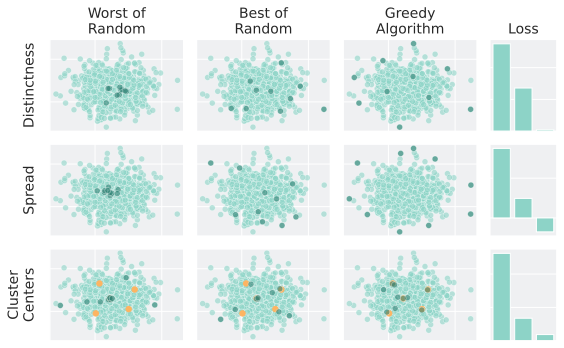

In [ ]:
nrows = 3
ncols = 4
titleSize = 14

ylabels = ["Distinctness", "Spread", "Cluster\nCenters"]
titles = ["Worst of\nRandom", "Best of\nRandom", "Greedy\nAlgorithm", "Loss"]
subsets = [[subsetDistinctnessWorst, subsetDistinctnessBest, subsetDistinctnessGreedy, None],
           [subsetSpreadWorst, subsetSpreadBest, subsetSpreadGreedy, None],
           [subsetClusterWorst, subsetClusterBest, subsetClusterGreedy, None]]
           
# Adjust the figsize to make room for the plots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8, 5), 
                        gridspec_kw={'width_ratios': [1, 1, 1, 0.5]})

for i in range(nrows):  # Loop through rows
    for j in range(ncols):  # Loop through columns
        ax = axs[i, j]
        if i == 0: # Add titles to top row
            ax.set_title(titles[j], fontsize=titleSize)
        if j < 3:
            fss.plot.scatter(ax = ax, 
                        color = color, 
                        dataset = secondDataset, 
                        subset = subsets[i][j],
                        alpha = 0.6,
                        transform="original")
            if i == 2:           
                ax.scatter(secondDataset.clusterCenters[:, 0], 
                           secondDataset.clusterCenters[:, 1], 
                           marker='o', 
                           color=color.palette["yellow"],
                           s=30,
                           zorder=3)
        else:
            loss_values = [subsets[i][0].loss, 
                           subsets[i][1].loss, 
                           subsets[i][2].loss]
            ax.bar(loss_labels, loss_values, color=[color.palette["green"]])
            ax.set_xticks([])
        if j == 0: # Add titles to first column
            ax.set_ylabel(ylabels[i], fontsize=titleSize)
        else:
            ax.set_ylabel(None)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_xlabel(None)


plt.savefig(f"../figures/{directory}/objectives-2.pdf", bbox_inches="tight")